### Hand pose estimation using `mediapipe`

In [1]:
import cv2,sys,time
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt
import mediapy as media
sys.path.append("../utils")
from mujoco_parser import MuJoCoParserClass
from util import get_idxs,rpy2r
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("cv2:[%s]"%(cv2.__version__))
print ("mediapipe:[%s]"%(mp.__version__))

cv2:[4.9.0]
mediapipe:[0.10.9]


#### Load images from the video

In [2]:
mp4_path = '../data/bam_yang_gang.mp4'
cap      = cv2.VideoCapture(mp4_path)
n_frame  = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
HZ       = int(cap.get(cv2.CAP_PROP_FPS))
print ("[%s] opened. #frame:[%d] HZ:[%d]"%(mp4_path,n_frame,HZ))
img_list = []
while cap.isOpened():
    ret,img_bgr = cap.read()
    if not ret: break
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_list.append(img_rgb)
print ("number of imgs:[%d]"%(len(img_list)))
print ("Done.")

[../data/bam_yang_gang.mp4] opened. #frame:[738] HZ:[30]
number of imgs:[738]
Done.


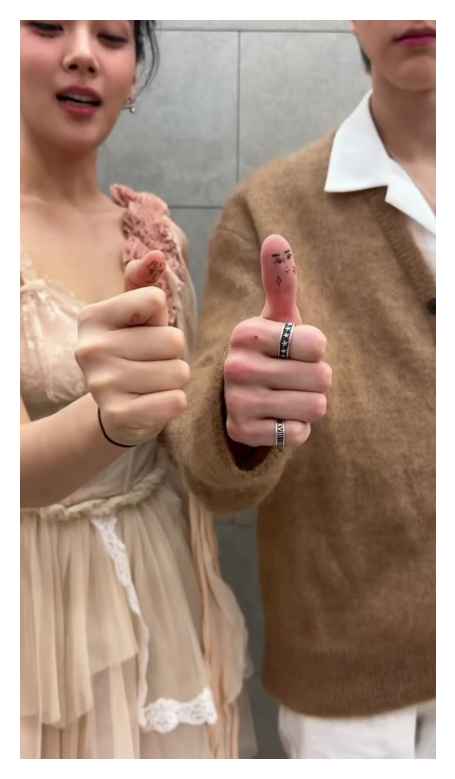

In [3]:
# Plot the first image
plt.imshow(img_list[0])
plt.axis('off')
plt.show()

#### Run hand pose estimation

In [4]:
# Initialize MediaPipe hand model
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(
    static_image_mode        = False,
    max_num_hands            = 2,
    model_complexity         = 1,
    min_detection_confidence = 0.25,
    min_tracking_confidence  = 0.25,
)
mp_drawing = mp.solutions.drawing_utils
print ("Mediapipe hand model ready.")

Mediapipe hand model ready.


I0000 00:00:1712056060.516306       1 gl_context.cc:344] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M2 Pro


In [5]:
img_with_res_list = []
print ("Start hand pose estimation of [%d] images..."%(n_frame))
VERBOSE = 0
for img_idx in range(n_frame):
    # Get image
    img = img_list[img_idx]
    # Run hand pose estimation
    res = hands.process(img)
    if VERBOSE:
        if res.multi_hand_landmarks:
            print ("[%d] #hand:[%d]"%(img_idx,len(res.multi_hand_landmarks)))
        else:
            print ("[%d] No hand"%(img_idx))
    img_with_res = img.copy()
    if res.multi_hand_landmarks:
        for hand_landmarks in res.multi_hand_landmarks:
            mp_drawing.draw_landmarks(
                img_with_res,
                hand_landmarks,
                mp_hands.HAND_CONNECTIONS,
                mp_drawing.DrawingSpec(color=(121, 22, 76), thickness=2, circle_radius=4),
                mp_drawing.DrawingSpec(color=(250, 44, 250), thickness=2, circle_radius=2),
            )
    # Put some text information on the image
    cv2.putText(
        img  = img_with_res,
        text = 'img_idx:[%d]'%(img_idx),
        org  = (20,40),
        fontFace  = cv2.FONT_HERSHEY_SIMPLEX,
        fontScale = 1,
        color     = (0,0,255),
        thickness = 2,
    )
    # Append
    img_with_res_list.append(img_with_res)
print ("Done.")

Start hand pose estimation of [738] images...


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


Done.


In [6]:
media.show_video(images=img_with_res_list,fps=HZ,width=200,downsample=False)

cap.release()
print ("Mediapipe released.")

Mediapipe released.


#### Now get 3D hand joints in `hand_pose_list`

In [7]:
img_start,img_end = 0,505
hand_pose_list = []
for img_idx in range(img_start,img_end): # for each frame
    img = img_list[img_idx] 
    res = hands.process(img) # run hand estimation
    n_landmark = 21 # fixed
    if res.multi_hand_world_landmarks: # if hands are detected
        n_detected_hand = len(res.multi_hand_world_landmarks) # number of detected hand(s)
        joint_xyzs_list = []
        for h_idx in range(n_detected_hand):
            joint_xyzs = np.zeros((n_landmark,3)) # [21 x 3]
            for l_idx in range(n_landmark): # for each landmark
                joint_xyzs[l_idx,0] = res.multi_hand_world_landmarks[h_idx].landmark[l_idx].x
                joint_xyzs[l_idx,1] = res.multi_hand_world_landmarks[h_idx].landmark[l_idx].y
                joint_xyzs[l_idx,2] = res.multi_hand_world_landmarks[h_idx].landmark[l_idx].z
            joint_xyzs_list.append(joint_xyzs)
        # Append
        hand_pose_list.append(joint_xyzs_list)
    else: # if no hand detected
        # Append
        hand_pose_list.append([])
print ("Done.")

Done.


In [8]:
cap.release()
print ("Mediapipe released.")

Mediapipe released.


![alt text](../data/hand_limbs.jpg)

In [9]:
# Match number of joints with Psyonic Hand
hand_pose_array = np.array(hand_pose_list[1:])
exclude = [4,8,12,16,20]
hand_idx_without_distal = [i for i in range(0,21) if i not in exclude]
hand_pose_array = hand_pose_array[:,1,hand_idx_without_distal,:]
print(hand_pose_array.shape)

# Filter the hand pose
import scipy
from scipy.ndimage import gaussian_filter1d

for i in range(16):
    for j in range(3):
        hand_pose_array[:,i,j] = gaussian_filter1d(hand_pose_array[:,i,j], sigma=3)

# Match dimensions with Psyonic Hand
psyonic_joint_idx_pairs = [[0,1],[1,2],[2,3],
                           [0,4],[4,5],[5,6],
                           [0,7],[7,8],[8,9],
                           [0,10],[10,11],[11,12],
                           [0,13],[13,14],[14,15]]
psyonic_limb_lengths = [0.0445638, 0.0314961, 0.0693509,
                        0.1050721, 0.0386104, 0.0402492,
                        0.1050354, 0.0386104, 0.0402492,
                        0.1029072, 0.0386104, 0.0402492,
                        0.1008422, 0.0386104, 0.0402492]
for i in range(hand_pose_array.shape[0]):
    for j in range(len(psyonic_limb_lengths)):
        idx_pair = psyonic_joint_idx_pairs[j]
        v = hand_pose_array[i,idx_pair[1],:] - hand_pose_array[i,idx_pair[0],:]
        hand_pose_array[i,idx_pair[1],:] = psyonic_limb_lengths[j] * v / np.linalg.norm(v) + hand_pose_array[i,idx_pair[0],:]

(504, 16, 3)


#### Animate the hand 3D joints in `MuJoCo`

In [10]:
xml_path = '../asset/kimlab_dualarms/scene_dualarms.xml'
env = MuJoCoParserClass(name='Dual Arms',rel_xml_path=xml_path,VERBOSE=True)
env.set_geom_color(rgba = (0.2,0.2,1.0,0.9),
    body_names_to_color = ['robot1/end_link','robot1/index_L1','robot1/index_L2','robot1/index_tip',
                           'robot1/middle_L1','robot1/middle_L2','robot1/middle_tip',
                           'robot1/ring_L1','robot1/ring_L2','robot1/ring_tip',
                           'robot1/pinky_L1','robot1/pinky_L2','robot1/pinky_tip',
                           'robot1/thumb_L1','robot1/thumb_L2','robot1/thumb_tip'])

env.set_geom_color(rgba = (1.0,0.2,0.2,0.9),
    body_names_to_color = ['robot2/end_link','robot2/index_L1','robot2/index_L2','robot2/index_tip',
                           'robot2/middle_L1','robot2/middle_L2','robot2/middle_tip',
                           'robot2/ring_L1','robot2/ring_L2','robot2/ring_tip',
                           'robot2/pinky_L1','robot2/pinky_L2','robot2/pinky_tip',
                           'robot2/thumb_L1','robot2/thumb_L2','robot2/thumb_tip'])

BODY_NAMES = ['robot2/thumb_L1', 'robot2/thumb_L2', 'robot2/thumb_tip',
              'robot2/index_L1', 'robot2/index_L2','robot2/index_tip',
              'robot2/middle_L1', 'robot2/middle_L2', 'robot2/middle_tip',
              'robot2/ring_L1', 'robot2/ring_L2', 'robot2/ring_tip',
              'robot2/pinky_L1', 'robot2/pinky_L2', 'robot2/pinky_tip']

JOINT_NAMES = ['robot2/joint1','robot2/joint2','robot2/joint3',
               'robot2/joint4','robot2/joint5','robot2/joint6',
               'robot2/index_q1', 'robot2/index_q2', 
               'robot2/middle_q1', 'robot2/middle_q2', 
               'robot2/ring_q1', 'robot2/ring_q2', 
               'robot2/pinky_q1', 'robot2/pinky_q2', 
               'robot2/thumb_q1', 'robot2/thumb_q2']

coupled_joint_names_list = [['robot1/index_q1','robot1/index_q2'],['robot1/middle_q1','robot1/middle_q2'],
                            ['robot1/ring_q1','robot1/ring_q2'],['robot1/pinky_q1','robot1/pinky_q2'],
                            ['robot2/index_q1','robot2/index_q2'],['robot2/middle_q1','robot2/middle_q2'],
                            ['robot2/ring_q1','robot2/ring_q2'],['robot2/pinky_q1','robot2/pinky_q2']]
coupled_joint_weights_list = [[2,3],[2,3],
                              [2,3],[2,3],
                              [2,3],[2,3],
                              [2,3],[2,3]]

dt:[0.0020] HZ:[500]
n_dof (=nv):[32]
n_geom:[55]
geom_names:[None, None, None, None, None, None, 'floor', None, None, None, None, None, None, None, None, None, None, None, None, 'robot1/wrist_mesh', 'robot1/palm_mesh', 'robot1/index_mesh_1', 'robot1/index_mesh_2', 'robot1/middle_mesh_1', 'robot1/middle_mesh_2', 'robot1/ring_mesh_1', 'robot1/ring_mesh_2', 'robot1/pinky_mesh_1', 'robot1/pinky_mesh_2', 'robot1/thumb_mesh_1', 'robot1/thumb_mesh_2', None, None, None, None, None, None, None, None, None, None, None, None, 'robot2/wrist_mesh', 'robot2/palm_mesh', 'robot2/index_mesh_1', 'robot2/index_mesh_2', 'robot2/middle_mesh_1', 'robot2/middle_mesh_2', 'robot2/ring_mesh_1', 'robot2/ring_mesh_2', 'robot2/pinky_mesh_1', 'robot2/pinky_mesh_2', 'robot2/thumb_mesh_1', 'robot2/thumb_mesh_2']
n_body:[43]
body_names:['world', 'robot1/link2', 'robot1/link3', 'robot1/link4', 'robot1/link5', 'robot1/link6', 'robot1/end_link', 'robot1/index_L1', 'robot1/index_L2', 'robot1/index_tip', 'robot1/middle_L1

#### Single Frame

In [22]:
env.init_viewer(
    viewer_title  = "Dual Arms Retargeting",
    viewer_width  = 1200,
    viewer_height = 800,
    viewer_hide_menus = True,
)
env.update_viewer(
    azimuth=152,distance=3,elevation=-33,lookat=[0.06,0.08,1],
    VIS_TRANSPARENT=True,VIS_CONTACTPOINT=False,
    contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
    VIS_JOINT=False,jointlength=0.5,jointwidth=0.1,
    jointrgba=[0.2,0.6,0.8,1],
)
env.reset()
tick,L = 60,len(hand_pose_array)
save_vid,frames = False,[] # save video?

q_start = env.data.qpos.copy()
q_start[16] = -np.pi/2
env.forward(q=q_start,INCREASE_TICK=True)
wrist_pos = env.get_p_body('robot2/end_link')
print("wrist pos: ", wrist_pos)

R = rpy2r(np.radians([0,0,-90]))@rpy2r(np.radians([0,90,0]))
hand_pose = hand_pose_array[tick]
xyz_offsets = np.array([0.25,0.25,0])
joint_xyzs = hand_pose@R # ndarray [16 x 3]
body_target = joint_xyzs + wrist_pos - joint_xyzs[0,:]

idxs = get_idxs(env.rev_joint_names,BODY_NAMES)
q_mins_body,q_maxs_body = env.rev_joint_mins[idxs],env.rev_joint_maxs[idxs]
joint_idxs_fwd_body = env.get_idxs_fwd(joint_names=JOINT_NAMES)
joint_idxs_jac_body = env.get_idxs_jac(joint_names=JOINT_NAMES)

p_target = {}
for i in range(len(BODY_NAMES)):
    p_target[BODY_NAMES[i]] = body_target[i+1,:]

while env.is_viewer_alive():
    # # Update
    # tick = tick + 1
    # if save_vid and (tick==L): break # animate once for saving video
    # if not save_vid and (tick==L-1): tick = 0 # otherwise loop
    # sec = tick/HZ
    # Hand rotation offset
    # wrist_pos = env.get_p_body('robot2/end_link')

    q_body = env.get_qpos_joints(JOINT_NAMES)
    for ik_tick in range(100):
        J_list,ik_err_list = [],[]
        for ik_body_name in BODY_NAMES:
            ik_p_trgt = p_target[ik_body_name]
            ik_R_trgt = None
            IK_P = True
            IK_R = False
            J,ik_err = env.get_ik_ingredients(
                body_name=ik_body_name,p_trgt=ik_p_trgt,R_trgt=ik_R_trgt,
                IK_P=IK_P,IK_R=IK_R)
            J_list.append(J)
            ik_err_list.append(ik_err)
        J_stack      = np.vstack(J_list)
        ik_err_stack = np.hstack(ik_err_list)
        dq = env.damped_ls(J_stack,ik_err_stack,stepsize=1,eps=1e-2,th=np.radians(1.0))
        q_body = q_body + dq[joint_idxs_jac_body]
        q_env = env.data.qpos.copy()
        q_env[joint_idxs_fwd_body] = q_body

        q_couple = env.get_q_couple(
            q_raw                      = q_env,
            coupled_joint_names_list   = coupled_joint_names_list,
            coupled_joint_weights_list = coupled_joint_weights_list,
        ) 
        q_body = q_couple[joint_idxs_fwd_body]

        env.forward(q=q_body,joint_idxs=joint_idxs_fwd_body)

    # Plot hand joints
    joint_xyzs = joint_xyzs + wrist_pos - joint_xyzs[0,:] + xyz_offsets
    n_joint = 16
    for j_idx in range(n_joint):
        joint_xyz = joint_xyzs[j_idx,:] # [3]
        env.plot_sphere(p=joint_xyz,r=0.005,rgba=(1,0,0,1))
    # Plot hand links
    hand_joint_idx_pairs = [[0,1],[1,2],[2,3],
                            [0,4],[4,5],[5,6],
                            [4,7],[7,8],[8,9],
                            [7,10],[10,11],[11,12],
                            [0,13],[10,13],[13,14],[14,15]]
    for hand_joint_idx_pair in hand_joint_idx_pairs:
        idx_fr,idx_to = hand_joint_idx_pair[0],hand_joint_idx_pair[1]
        env.plot_cylinder_fr2to(
            p_fr = joint_xyzs[idx_fr,:],
            p_to = joint_xyzs[idx_to,:],
            r    = 0.003,
            rgba = [0.7,0.7,0.7,1],
        )

    env.plot_T(p=np.zeros(3),R=np.eye(3,3),PLOT_AXIS=True,axis_len=1.0,axis_width=0.005)
    # env.plot_T(p=np.array([0,0,1]),R=np.eye(3,3),PLOT_AXIS=False,
    #            label='tick:[%d/%d] time:[%.2f]'%(tick,L,sec))
    env.render()
    # Append image
    if save_vid: frames.append(env.grab_image())
# Close viewer
env.close_viewer()
# Show video
# if save_vid: media.show_video(images=frames,fps=HZ,width=1000,downsample=False)
print ("Done.")

wrist pos:  [ 0.41109235 -0.50891615  1.66008385]
Pressed ESC
Quitting.
Done.


In [ ]:
# np.save('hand_pose_array.npy',hand_pose_array)
# hand_pose_array = np.load('hand_pose_array.npy')

#### Entire Sequence

In [23]:
for repeat in range(2):
    env.init_viewer(
        viewer_title  = "Dual Arms Retargeting",
        viewer_width  = 1200,
        viewer_height = 800,
        viewer_hide_menus = True,
    )
    env.update_viewer(
        azimuth=152,distance=3,elevation=-33,lookat=[0.06,0.08,1],
        VIS_TRANSPARENT=True,VIS_CONTACTPOINT=False,
        contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
        VIS_JOINT=False,jointlength=0.5,jointwidth=0.1,
        jointrgba=[0.2,0.6,0.8,1],
    )

    L = len(hand_pose_array)
    R = rpy2r(np.radians([0,0,-90]))@rpy2r(np.radians([0,90,0]))
    xyz_offsets = np.array([0.25,0.25,0])

    start_pos = hand_pose_array[0]@R
    wrist_offset = start_pos[0,:] - np.array([0.05,0.1,-0.15])

    q_list = []
    body_list = []
    prev_q_pos = env.data.qpos.copy()
    prev_q_pos[16] = -np.pi/2
    env.forward(q=prev_q_pos)
    wrist_pos = env.get_p_body('robot2/end_link')

    for tick in range(L):
        env.reset()
        env.forward(q=prev_q_pos,INCREASE_TICK=True)

        hand_pose = hand_pose_array[tick]
        joint_xyzs = hand_pose@R # ndarray [16 x 3]
        body_target = joint_xyzs + wrist_pos - wrist_offset
        body_list.append(body_target)

        idxs = get_idxs(env.rev_joint_names,JOINT_NAMES)
        q_mins_body,q_maxs_body = env.rev_joint_mins[idxs],env.rev_joint_maxs[idxs]
        joint_idxs_fwd_body = env.get_idxs_fwd(joint_names=JOINT_NAMES)
        joint_idxs_jac_body = env.get_idxs_jac(joint_names=JOINT_NAMES)

        p_target = {}
        for i in range(len(BODY_NAMES)):
            p_target[BODY_NAMES[i]] = body_target[i+1,:]

        prev_q_pos = env.data.qpos.copy()

        while env.tick < 200:
            q_body = env.get_qpos_joints(JOINT_NAMES)
            for ik_tick in range(100):
                J_list,ik_err_list = [],[]
                for ik_body_name in BODY_NAMES:
                    ik_p_trgt = p_target[ik_body_name]
                    ik_R_trgt = None
                    IK_P = True
                    IK_R = False
                    J,ik_err = env.get_ik_ingredients(
                        body_name=ik_body_name,p_trgt=ik_p_trgt,R_trgt=ik_R_trgt,
                        IK_P=IK_P,IK_R=IK_R)
                    J_list.append(J)
                    ik_err_list.append(ik_err)
                J_stack      = np.vstack(J_list)
                ik_err_stack = np.hstack(ik_err_list)
                dq = env.damped_ls(J_stack,ik_err_stack,stepsize=1,eps=1e-2,th=np.radians(1.0))
                q_body = q_body + dq[joint_idxs_jac_body]
                q_body = np.clip(q_body,q_mins_body,q_maxs_body)
                q_env = env.data.qpos.copy()
                q_env[joint_idxs_fwd_body] = q_body

                q_couple = env.get_q_couple(
                    q_raw                      = q_env,
                    coupled_joint_names_list   = coupled_joint_names_list,
                    coupled_joint_weights_list = coupled_joint_weights_list,
                ) 
                q_body = q_couple[joint_idxs_fwd_body]

                env.forward(q=q_body,joint_idxs=joint_idxs_fwd_body)

            # Plot hand joints
            joint_xyzs = joint_xyzs + wrist_pos - wrist_offset + xyz_offsets
            n_joint = 16
            for j_idx in range(n_joint):
                joint_xyz = joint_xyzs[j_idx,:] # [3]
                env.plot_sphere(p=joint_xyz,r=0.005,rgba=(1,0,0,1))
            # Plot hand links
            hand_joint_idx_pairs = [[0,1],[1,2],[2,3],
                                    [0,4],[4,5],[5,6],
                                    [4,7],[7,8],[8,9],
                                    [7,10],[10,11],[11,12],
                                    [0,13],[10,13],[13,14],[14,15]]
            for hand_joint_idx_pair in hand_joint_idx_pairs:
                idx_fr,idx_to = hand_joint_idx_pair[0],hand_joint_idx_pair[1]
                env.plot_cylinder_fr2to(
                    p_fr = joint_xyzs[idx_fr,:],
                    p_to = joint_xyzs[idx_to,:],
                    r    = 0.003,
                    rgba = [0.7,0.7,0.7,1],
                )

            env.plot_T(p=np.zeros(3),R=np.eye(3,3),PLOT_AXIS=True,axis_len=1.0,axis_width=0.005)
            # env.plot_T(p=np.array([0,0,1]),R=np.eye(3,3),PLOT_AXIS=False,
            #            label='tick:[%d/%d] time:[%.2f]'%(tick,L,sec))
            # env.render()
            # Append image
        # Close viewer
        env.close_viewer()
        q_data = env.data.qpos.copy()
        # q_data = np.clip(q_data,env.rev_joint_mins,env.rev_joint_maxs)
        q_list.append(q_data)
        if repeat == 1: 
            if tick%10==0 or tick==L-1: print("Tick %d/%d completed."%(tick,L))
    # Show video
    # if save_vid: media.show_video(images=frames,fps=HZ,width=1000,downsample=False)
    print ("Done.")

Done.
Tick 0/504 completed.
Tick 10/504 completed.
Tick 20/504 completed.
Tick 30/504 completed.
Tick 40/504 completed.
Tick 50/504 completed.
Tick 60/504 completed.
Tick 70/504 completed.
Tick 80/504 completed.
Tick 90/504 completed.
Tick 100/504 completed.
Tick 110/504 completed.
Tick 120/504 completed.
Tick 130/504 completed.
Tick 140/504 completed.
Tick 150/504 completed.
Tick 160/504 completed.
Tick 170/504 completed.
Tick 180/504 completed.
Tick 190/504 completed.
Tick 200/504 completed.
Tick 210/504 completed.
Tick 220/504 completed.
Tick 230/504 completed.
Tick 240/504 completed.
Tick 250/504 completed.
Tick 260/504 completed.
Tick 270/504 completed.
Tick 280/504 completed.
Tick 290/504 completed.
Tick 300/504 completed.
Tick 310/504 completed.
Tick 320/504 completed.
Tick 330/504 completed.
Tick 340/504 completed.
Tick 350/504 completed.
Tick 360/504 completed.
Tick 370/504 completed.
Tick 380/504 completed.
Tick 390/504 completed.
Tick 400/504 completed.
Tick 410/504 complete

In [ ]:
# q_array = np.array(q_list)
# np.save('q_array.npy', q_array) # Joint angles of the robot
# np.save('hand_pose_array.npy', hand_pose_array) # Hand joint positions

#### Visualization

In [24]:
env.init_viewer(
    viewer_title  = "Dual Arms Retargeting",
    viewer_width  = 1200,
    viewer_height = 800,
    viewer_hide_menus = True,
)
env.update_viewer(
    azimuth=142,distance=1.5,elevation=-35.5,lookat=[0.05,0.03,1.21], # side view
    # azimuth=180,distance=1.5,elevation=-27,lookat=[0.05,0.04,1.31], # front view
    VIS_TRANSPARENT=True,VIS_CONTACTPOINT=False,
    contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
    VIS_JOINT=False,jointlength=0.5,jointwidth=0.1,
    jointrgba=[0.2,0.6,0.8,1],
)

env.reset()
save_vid,frames = True,[]

tick,L = 0,len(q_list)
while env.is_viewer_alive():
    if save_vid and (tick==L): break # animate once for saving video
    if not save_vid and (tick==L-1): tick = 0 # otherwise loop

    q = q_list[tick]
    env.forward(q=q,INCREASE_TICK=True)

    # Plot hand joints
    R = rpy2r(np.radians([0,0,-90]))@rpy2r(np.radians([0,90,0]))
    hand_pose = hand_pose_array[tick]
    xyz_offsets = np.array([0.25,0.25,0])
    joint_xyzs = hand_pose@R # ndarray [16 x 3]
    joint_xyzs = joint_xyzs + wrist_pos - wrist_offset + xyz_offsets
    n_joint = 16
    for j_idx in range(n_joint):
        joint_xyz = joint_xyzs[j_idx,:] # [3]
        env.plot_sphere(p=joint_xyz,r=0.005,rgba=(1,0,0,1))
    # Plot hand links
    hand_joint_idx_pairs = [[0,1],[1,2],[2,3],
                            [0,4],[4,5],[5,6],
                            [4,7],[7,8],[8,9],
                            [7,10],[10,11],[11,12],
                            [0,13],[10,13],[13,14],[14,15]]
    for hand_joint_idx_pair in hand_joint_idx_pairs:
        idx_fr,idx_to = hand_joint_idx_pair[0],hand_joint_idx_pair[1]
        env.plot_cylinder_fr2to(
            p_fr = joint_xyzs[idx_fr,:],
            p_to = joint_xyzs[idx_to,:],
            r    = 0.003,
            rgba = [0.7,0.7,0.7,1],
        )

    env.plot_T(p=np.array([0,0,1]),R=np.eye(3,3),PLOT_AXIS=False,
               label='tick:[%d/%d]'%(tick,L))
    env.render()
    # Append image
    if save_vid: frames.append(env.grab_image())

    tick = tick + 1

env.close_viewer()
# Show video
if save_vid: media.show_video(images=frames,fps=HZ,width=1000,downsample=False)
print ("Done.")

Done.


### Plot joint angle position / velocity / acceleration

In [ ]:
idxs = get_idxs(env.rev_joint_names,JOINT_NAMES)
joint_angles = np.array(q_list)[:,idxs] # radians
# joint_angles = np.degrees(joint_angles)
num_joints = len(JOINT_NAMES) # 16

In [ ]:
time = np.arange(0,L)
plt.figure(figsize=(20,10))
cs = [plt.cm.gist_rainbow(x) for x in np.linspace(0,1,num_joints)]
for i in range(len(idxs)):
    plt.plot(time, joint_angles[:,i], color=cs[i], label=JOINT_NAMES[i])

plt.legend()

plt.xlabel('Timesteps',fontsize=16)
plt.ylabel('Joint Angles (rad)',fontsize=16)
plt.show()

In [ ]:
joint_vels = (joint_angles[1:] - joint_angles[:-1]) * HZ
plt.figure(figsize=(20,10))
for i in range(len(idxs)):
    plt.plot(time[:-1], joint_vels[:,i], color=cs[i], label=JOINT_NAMES[i])

plt.legend()

plt.xlabel('Timesteps',fontsize=16)
plt.ylabel('Joint Velocities (rad/s)',fontsize=16)
plt.show()

In [ ]:
joint_accs = (joint_vels[1:] - joint_vels[:-1]) * HZ
plt.figure(figsize=(20,10))
for i in range(len(idxs)):
    plt.plot(time[:-2], joint_accs[:,i], color=cs[i], label=JOINT_NAMES[i])

plt.legend()

plt.xlabel('Timesteps',fontsize=16)
plt.ylabel('Joint Velocities (rad/s^2)',fontsize=16)
plt.show()